In [1]:
import warnings
    
# Settings the warnings to be ignored
warnings.filterwarnings('ignore')

# primary modules

#utils
from tqdm.notebook import tqdm
import datetime

# second part
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

import statsmodels.tsa.api as ts

from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.api import VAR

from sklearn.metrics import r2_score
from darts.metrics.metrics import rmse, r2_score
from darts.models import RNNModel, ExponentialSmoothing, BlockRNNModel

from sklearn.preprocessing import StandardScaler
from darts.dataprocessing.transformers import Scaler
from darts import concatenate as ts_concat

from darts.models.forecasting.varima import VARIMA
from darts.timeseries import TimeSeries as TS
from darts.models.forecasting.random_forest import RandomForest
from darts.models import ExponentialSmoothing

from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.api import VAR


In [2]:
import seaborn as sns
sns.set(rc={'figure.figsize':(11.7,8.27)})


### 1. Data import & Preprocessing

In [3]:
%%time
df = pd.read_csv('./data/full_data_sum.csv')
# df = df.drop(columns=['Unnamed: 0', 'time', 'country_code'])
df['date'] = pd.to_datetime(df['date'])
df['dt'] = pd.to_datetime(df.date) + df.hour.astype('timedelta64[h]')

CPU times: user 1.6 s, sys: 190 ms, total: 1.79 s
Wall time: 1.81 s


In [4]:
df.groupby('square_id')['sms_in'].sum().sort_values()

square_id
5439    2.014008e+03
9244    1.361058e+04
8746    1.364174e+04
9145    1.364497e+04
9146    1.373616e+04
            ...     
5159    7.843400e+05
5061    8.551464e+05
6064    9.308184e+05
5161    1.057283e+06
5059    1.151623e+06
Name: sms_in, Length: 2109, dtype: float64

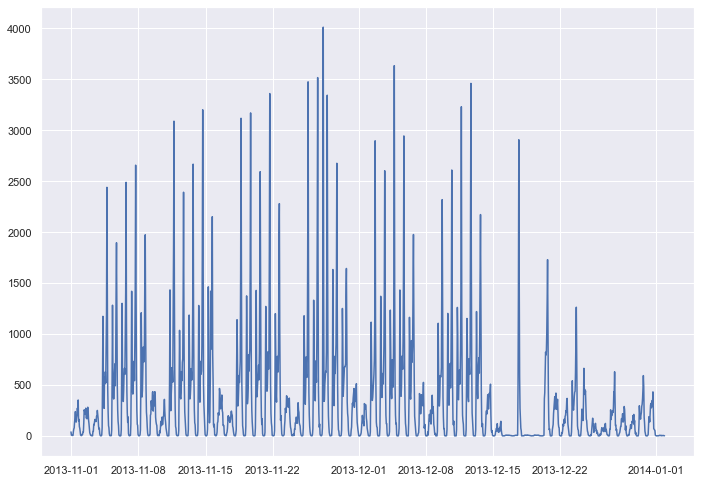

In [5]:
plt.plot(df[df.square_id==4874]['dt'], df[df.square_id==4874]['sms_in'])

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3137833 entries, 0 to 3137832
Data columns (total 9 columns):
 #   Column     Dtype         
---  ------     -----         
 0   square_id  int64         
 1   date       datetime64[ns]
 2   hour       int64         
 3   sms_in     float64       
 4   sms_out    float64       
 5   call_in    float64       
 6   call_out   float64       
 7   internet   float64       
 8   dt         datetime64[ns]
dtypes: datetime64[ns](2), float64(5), int64(2)
memory usage: 215.5 MB


In [13]:
# broken bs
# 4471
# 4570
# 4571
# 4671


In [14]:
# 4672
# 4771
# 4875
# 5439
# 5440

In [7]:
series = ['internet', 'sms_in', 'sms_out', 'call_in', 'call_out']
nans = df[series].isna().groupby(df.square_id).sum().reset_index().set_index('square_id') / 1488

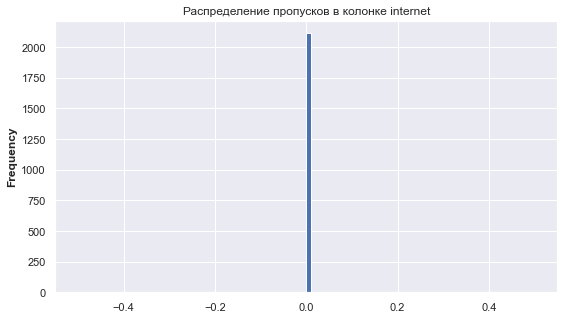

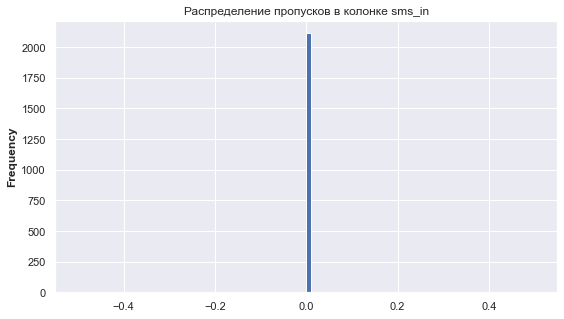

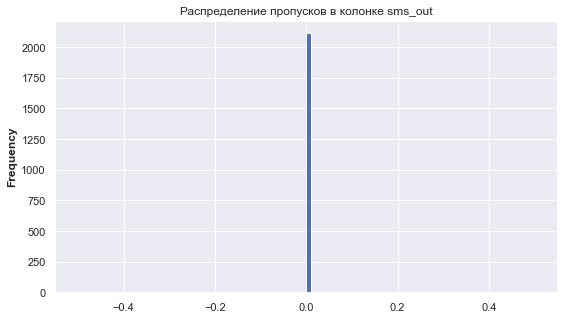

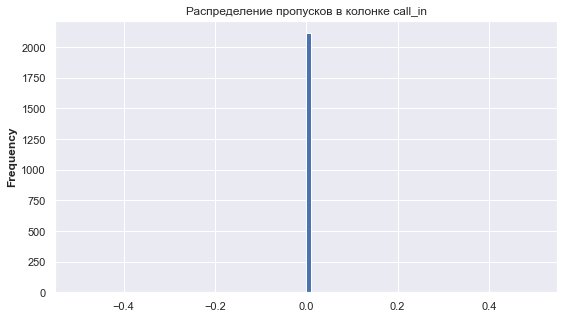

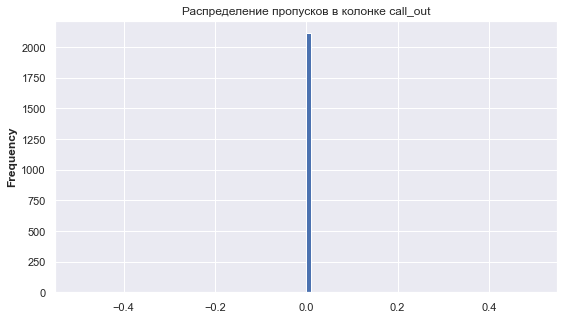

In [8]:
# fig, axes = plt.subplots(31)

for col in series:
    nans[col].plot(kind='hist', 
                          bins=100, 
                          title=f'Распределение пропусков в колонке {col}',
                          figsize=(9,5))
    plt.show()

### 2. Analytics

#### 2.1. TS analytics

TO DO: добавить разделение на обучение и вплидацию в визуализацию

In [9]:
def vis_col(df: pd.DataFrame, col: str):
    """
    
    """

    fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(30,15))
    # оси для первых двух графиков
    ax1 = axs[0, 0]
    ax2 = axs[0, 1]

    # ось для большого графика
    gs = axs[0, 1].get_gridspec()
    
    axs[1, 0].remove()
    axs[1, 1].remove()
    axs[0, 2].remove()
    axs[0, 3].remove()
    axs[1, 2].remove()
    axs[1, 3].remove()
    
    ax3 = fig.add_subplot(gs[1, 0:2])

    # ось для четвертонго графика

    ax4 = fig.add_subplot(gs[0:2, 2:4])
    
    
    
    example = df[df.square_id==247].set_index('date')[col]
    
    # подсчитываем усредненное значение интернет-нагрузки за каждый час
    _agg = df.groupby(['date', 'hour'])[col].mean()
    # оставляем в индексе только дату
    _agg = _agg.reset_index().set_index('date')[col]



    #plot1
    sns.histplot(df[col], bins=100, ax=ax1).set(title=f'Распределение значений {col}');
    #plot2
    sns.lineplot(x=example.index,
                 y=example.values,
                 errorbar='ci',
                 err_style='band', ax=ax2).set(title=f'Пример изменения {col} на одной станции');
    ax2.tick_params(axis='x', rotation=45)
    #plot3
    sns.lineplot(data=_agg,
                 errorbar='ci',
                 err_style='band', ax=ax3).set(title=f'Изменение среднего значения {col} за исследуемый период');
    ax3.tick_params(axis='x', rotation=45)
    
    #plot4
    nlags = 24 * 7 
    corrs, ccnf_intervals = ts.acf(_agg, nlags=nlags, alpha=.05)
    sns.barplot(x=np.arange(0,nlags+1), y=corrs, ax=ax4).set(title=f'АКФ признака {col} за периоды от 1 до {nlags} часов');
    ax4.xaxis.set_ticks(np.arange(0, nlags+1, 10))
    ax4.tick_params(axis='x', rotation=45)
    

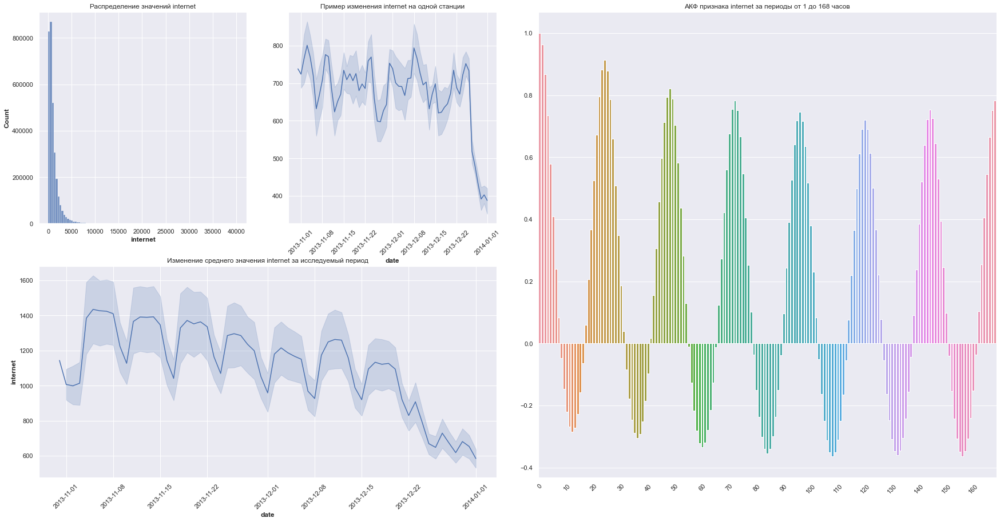

In [10]:
vis_col(df, 'internet')

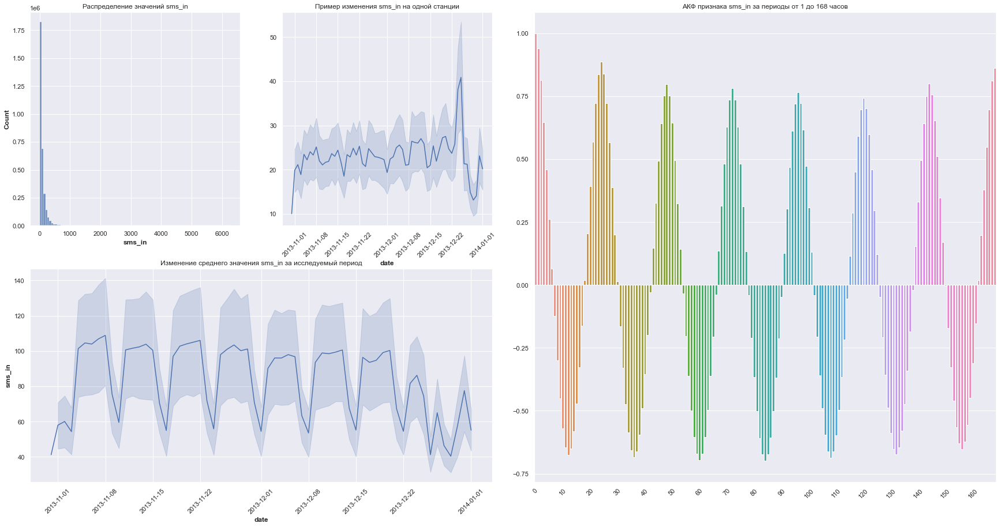

In [11]:
vis_col(df, 'sms_in')

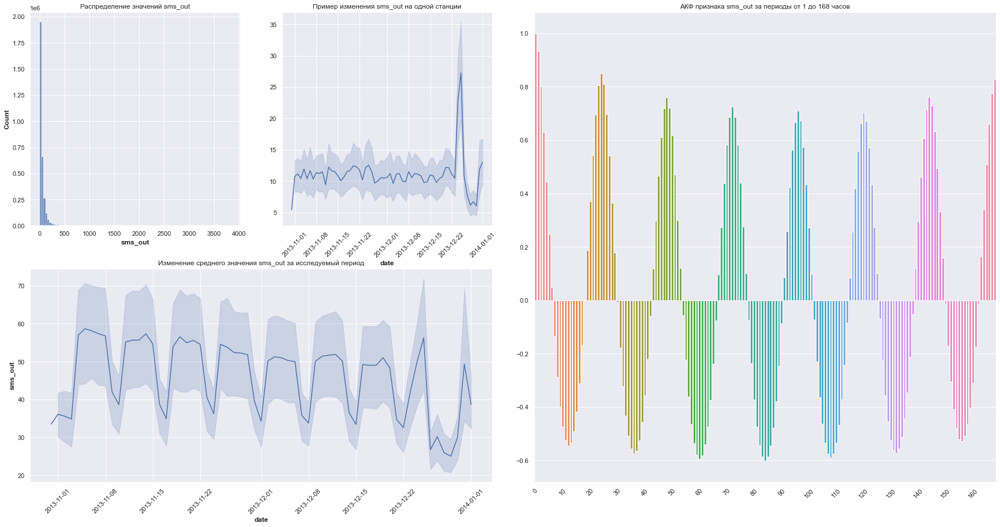

In [12]:
vis_col(df, 'sms_out')

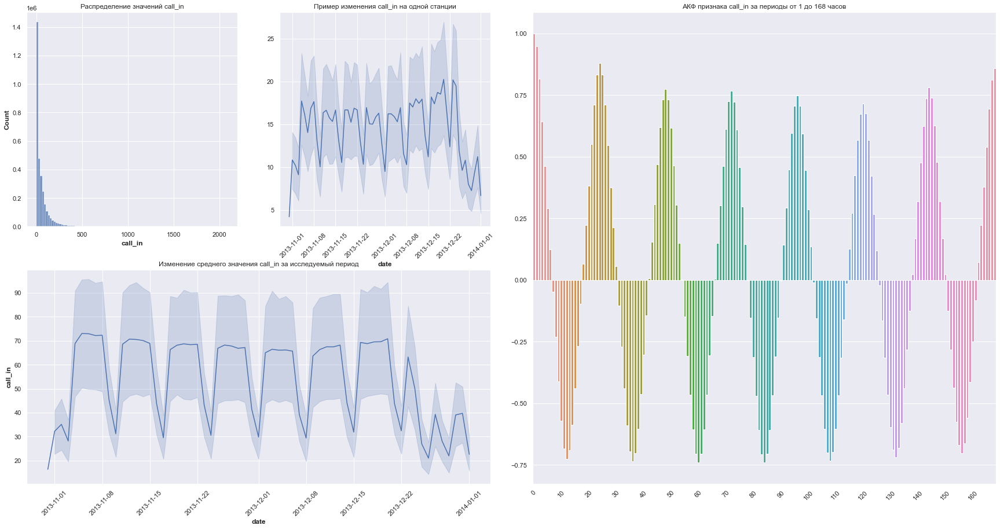

In [13]:
vis_col(df, 'call_in')

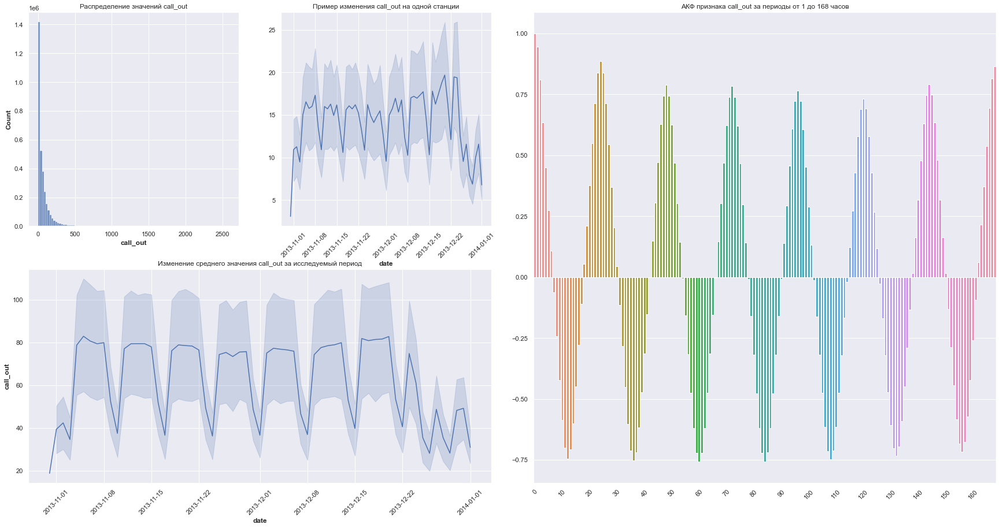

In [14]:
vis_col(df, 'call_out')

### 3. Train-test split

#### 3.1 date formatting

In [15]:
df['dt'] = pd.to_datetime(df.date) + df.hour.astype('timedelta64[h]')

In [16]:
dates = sorted(df.date.unique())
train_dates = dates[:49]
val_dates = dates[49:]


In [17]:
train = df[df.date.isin(train_dates)]
val = df[df.date.isin(val_dates)]

### 5. Reproduce base models results

#### 1. Dataset construction

In [18]:
train_df = pd.DataFrame(index=train.dt.unique())
assert train_df.index.is_monotonic == True
value_cols = []
for i, bs in tqdm(enumerate(train.square_id.unique())):
    train_ts = train[train.square_id==bs].set_index('dt')['internet'].ffill()
    train_ts.name = f'internet_{bs}'
    try:
        assert train_ts.index.is_monotonic == True
        assert train_ts.isna().sum() == 0
        assert train_ts.shape[0] == train_df.shape[0]
        train_df[f'internet_{bs}'] = train_ts
        value_cols.append(f'internet_{bs}')
    except:
        pass
        
        
val_df = pd.DataFrame(index=val.dt.unique())
assert val_df.index.is_monotonic == True
for i, bs in tqdm(enumerate(val.square_id.unique())):
    val_ts = val[val.square_id==bs].set_index('dt')['internet'].ffill()
    val_ts.name = f'internet_{bs}'
    try:
        assert val_ts.index.is_monotonic == True
        assert val_ts.isna().sum() == 0
        val_df[f'internet_{bs}'] = val_ts
    except:
        pass

0it [00:00, ?it/s]

0it [00:00, ?it/s]

#### 2. Find linear dependencies

In [19]:
%%time 
corr_matrix = pd.DataFrame(train_df).corr().abs()
sol = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
                  .stack()
                  .sort_values(ascending=False))

CPU times: user 8.86 s, sys: 225 ms, total: 9.08 s
Wall time: 9.12 s


In [27]:
bad_cols = []
for i in sol[sol>=0.9].index:
    bad_cols.append(i[1])
bad_cols = list(set(bad_cols))

#### 3. Construct dataset

In [28]:
# mode linear or not
to_select = list((set(train_df.columns) & set(val_df.columns)) - set(bad_cols))
# to_select = list((set(train_df.columns) & set(val_df.columns)))

In [30]:
train_ts = TS.from_dataframe(train_df.reset_index(),
                             time_col = 'index',
                             value_cols = to_select)

val_ts = TS.from_dataframe(val_df.reset_index(),
                             time_col = 'index',
                             value_cols = to_select)

In [31]:
%%time
global_train = []
for col in tqdm(to_select):
    ts = TS.from_series(train_df[col].astype(np.float32))
    global_train.append(ts)
    
    
global_val = []
for col in tqdm(to_select):
    ts = TS.from_series(val_df[col].astype(np.float32))
    global_val.append(ts)

global_df = pd.concat([train_df, val_df], axis=0)
full_ts = []
for col in tqdm(to_select):
    ts = TS.from_series(global_df[col].astype(np.float32))
    full_ts.append(ts)


  0%|          | 0/388 [00:00<?, ?it/s]

  0%|          | 0/388 [00:00<?, ?it/s]

  0%|          | 0/388 [00:00<?, ?it/s]

CPU times: user 803 ms, sys: 39.7 ms, total: 843 ms
Wall time: 826 ms


In [32]:
print(len(global_train), global_train[0].values().shape)
print(len(global_val), global_val[0].values().shape)

388 (1153, 1)
388 (335, 1)


#### 4.1 LR

In [33]:
from darts.models.forecasting.linear_regression_model import LinearRegressionModel

scaler = StandardScaler()
transformer = Scaler(scaler)

linreg = LinearRegressionModel(lags=24, 
                               lags_past_covariates=10,
                               lags_future_covariates=(10,10),
                               multi_models=False,
                               add_encoders={
                               'cyclic': {'past': ['month'],},
                               'datetime_attribute': {'past': ['hour', 'dayofweek'],
                                                      'future': ['hour', 'dayofweek']},
                               'transformer': transformer}
                         
                              )
linreg.fit(global_train)

# backtest
preds_hist = linreg.historical_forecasts(full_ts, 
                                         start=pd.Timestamp(min(val_dates)),
                                         retrain=False, # do not refit model
                                         forecast_horizon=48, # forecast for week forward
                                         stride=48, # do forecasts every stride steps
                                         last_points_only=False,
                                         overlap_end=True, # do not overlap end of target series
                                         verbose=True # show logs
                                         )
preds_hist = [ts_concat(t)[:-1] for t in preds_hist] 

  0%|          | 0/388 [00:00<?, ?it/s]

#### 5. Validation

In [125]:
def get_metrics(global_val, preds_hist):
    """
    """
    r2_base = r2_score(actual_series=global_val, pred_series=preds_hist)
    rmse_base = rmse(actual_series=global_val, pred_series=preds_hist)

    return {'r2': r2_base, 'rmse': rmse_base}

def vis_metrics(global_val: list, preds: list):
    """
    
    """

    fig, axs = plt.subplots(ncols=1, nrows=2, figsize=(10,10))
    # оси для первых двух графиков
    ax1 = axs[0]
    ax2 = axs[1]

    metrics = get_metrics(global_val, preds)
    r2_base = metrics['r2']
    rmse_base = metrics['rmse']
    
    #plot1
    sns.histplot(rmse_base, bins=200, ax=ax1).set(title=f'RMSE dist: {np.mean(rmse_base)} +- {np.std(rmse_base)}, median: {np.median(rmse_base)}');

    #plot2
    sns.histplot(r2_base, bins=200, ax=ax2).set(title=f'Распределение R2: {np.mean(r2_base)} +- {np.std(r2_base)}, median: {np.median(r2_base)} ');

    
def show_errors(full_ts:list ,global_val: list, preds: list, num_samples=5, metric='r2'):
    
    fig, axs = plt.subplots(ncols=1, nrows=num_samples, figsize=(15,4*num_samples))

    metrics = get_metrics(global_val, preds_hist)[metric]
    

    idx = np.argsort(metrics)[:num_samples]

    for i in range(num_samples):
        sns.lineplot(x=full_ts[idx[i]].time_index, y= full_ts[idx[i]].values().reshape(-1), ax=axs[i])
        sns.lineplot(x=preds_hist[idx[i]].time_index, y=preds_hist[idx[i]].values().reshape(-1), ax=axs[i]).set(title=f'{metric.upper()}: {r2_base[idx[i]]}');

def show_corrects(full_ts:list ,global_val: list, preds: list, num_samples=5, metric='r2'):
    
    fig, axs = plt.subplots(ncols=1, nrows=num_samples, figsize=(15,4*num_samples))

    metrics = get_metrics(global_val, preds_hist)[metric]
    idx = np.argsort(metrics)[-num_samples:]
    
    for i in range(num_samples):
        sns.lineplot(x=full_ts[idx[i]].time_index, y= full_ts[idx[i]].values().reshape(-1), ax=axs[i])
        sns.lineplot(x=preds_hist[idx[i]].time_index, y=preds_hist[idx[i]].values().reshape(-1), ax=axs[i]).set(title=f'{metric.upper()}: {r2_base[idx[i]]}');


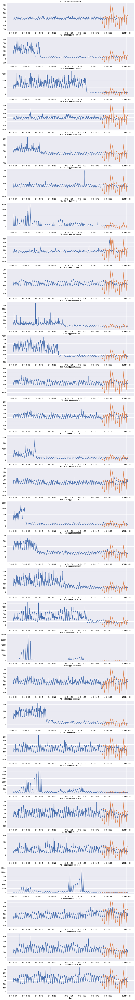

In [100]:
show_errors(full_ts, global_val, preds_hist, 30)

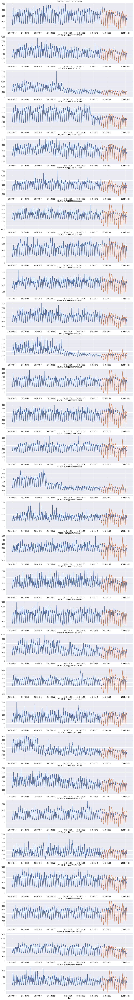

In [111]:
show_errors(full_ts, global_val, preds_hist, 30, 'rmse')

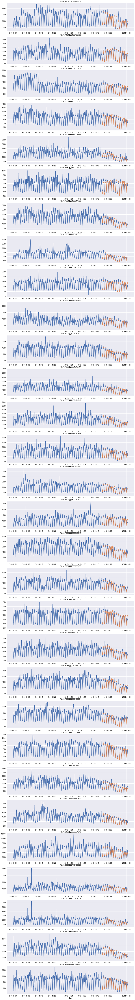

In [103]:
show_corrects(full_ts, global_val, preds_hist, 30)

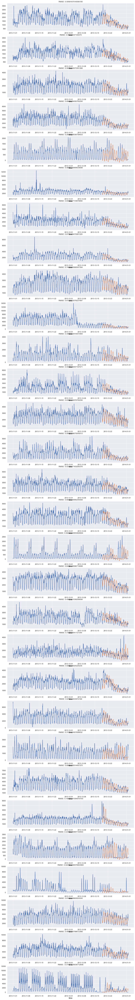

In [112]:
show_corrects(full_ts, global_val, preds_hist, 30, 'rmse')

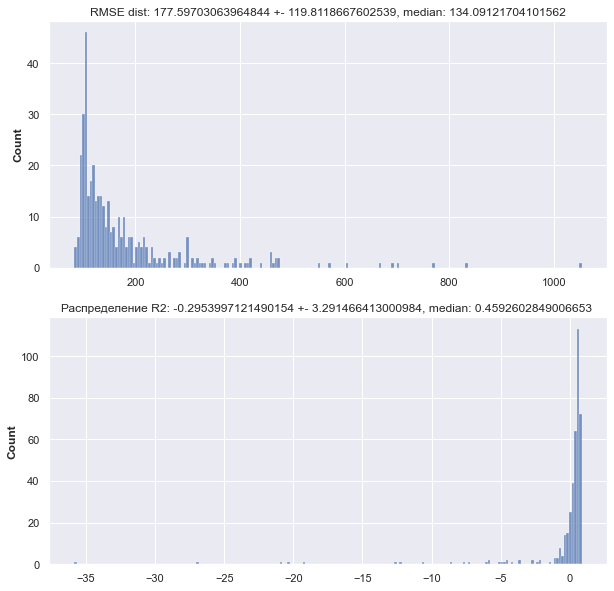

In [108]:
vis_metrics(global_val, preds_hist)

## Linear regression 2

In [114]:
from darts.models.forecasting.linear_regression_model import LinearRegressionModel
from sklearn.preprocessing import MinMaxScaler

min_max = Scaler(MinMaxScaler())

linreg_minmax = LinearRegressionModel(lags=72, 
                               lags_past_covariates=40,
                               lags_future_covariates=(10,10),
                               multi_models=False,
                               add_encoders={
                               'cyclic': {'past': ['month'],},
                               'datetime_attribute': {'past': ['hour', 'dayofweek'],
                                                      'future': ['hour', 'dayofweek']},
                               'transformer': min_max}
                         
                              )
linreg_minmax.fit(global_train)

# backtest
preds_min_max = linreg_minmax.historical_forecasts(full_ts, 
                                         start=pd.Timestamp(min(val_dates)),
                                         retrain=False, # do not refit model
                                         forecast_horizon=48, # forecast for week forward
                                         stride=48, # do forecasts every stride steps
                                         last_points_only=False,
                                         overlap_end=True, # do not overlap end of target series
                                         verbose=True # show logs
                                         )
preds_min_max = [ts_concat(t)[:-1] for t in preds_min_max] 

  0%|          | 0/388 [00:00<?, ?it/s]

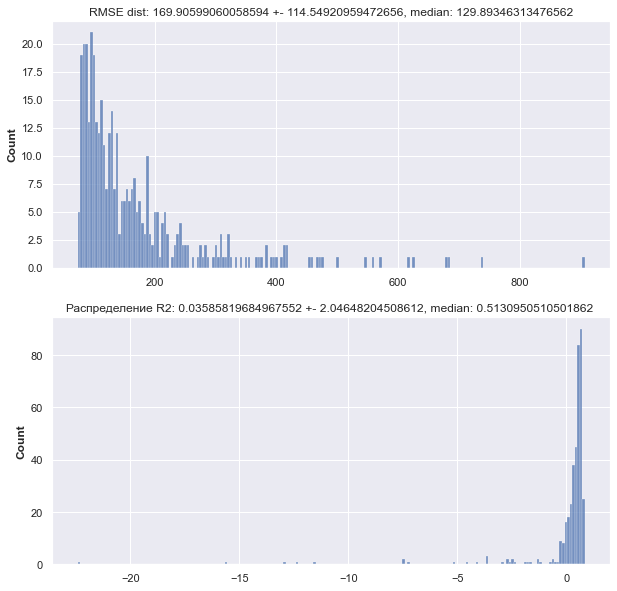

In [126]:
vis_metrics(global_val, preds_min_max)

### Linreg retrain

In [133]:
from darts.models.forecasting.linear_regression_model import LinearRegressionModel
from sklearn.preprocessing import MinMaxScaler

min_max = Scaler(MinMaxScaler())

linreg_minmax = LinearRegressionModel(lags=72, 
                               lags_past_covariates=40,
                               lags_future_covariates=(10,10),
                               multi_models=False,
                               add_encoders={
                               'cyclic': {'past': ['month'],},
                               'datetime_attribute': {'past': ['hour', 'dayofweek'],
                                                      'future': ['hour', 'dayofweek']},
                               'transformer': min_max}
                         
                              )
linreg_minmax.fit(global_train)

# backtest
preds_min_max = linreg_minmax.historical_forecasts(full_ts, 
                                         start=pd.Timestamp(min(val_dates)),
                                         retrain=False, # do not refit model
                                         forecast_horizon=12, # forecast for week forward
                                         stride=12, # do forecasts every stride steps
                                         last_points_only=False,
                                         overlap_end=True, # do not overlap end of target series
                                         verbose=True # show logs
                                         )
preds_min_max = [ts_concat(t)[:-1] for t in preds_min_max] 

  0%|          | 0/388 [00:00<?, ?it/s]

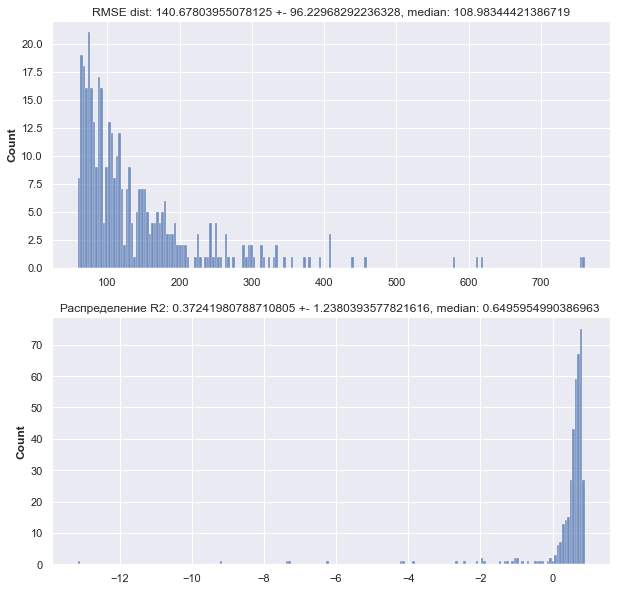

In [134]:
vis_metrics(global_val, preds_min_max)

#### VARIMA

In [ ]:
%%time
varima = VARIMA()
varima.fit(train_ts)

In [41]:
model

In [40]:
%%time 
model = VAR(endog=train_df[to_select].values).fit()

CPU times: user 981 ms, sys: 12.6 ms, total: 993 ms
Wall time: 160 ms


In [77]:
preds = val_df.copy()[to_select] * 0
preds[to_select] = model.forecast(train_df[to_select].values, steps=311)
preds = TS.from_dataframe(preds.reset_index(),
                             time_col = 'index',
                             value_cols = to_select)

In [81]:
from darts.metrics.metrics import rmse, r2_score

In [83]:
mape(actual_series=val_ts, pred_series=preds), r2_score(actual_series=val_ts, pred_series=preds)

(64.16616775500393, -2.280702517622683)

In [84]:
from darts.models.forecasting.baselines import NaiveDrift

In [96]:
base = NaiveDrift()
base.fit(train_ts)
base_preds = base.predict(n=311)

In [97]:
mape(actual_series=val_ts, pred_series=base_preds), r2_score(actual_series=val_ts, pred_series=base_preds)

(51.38526793738166, -1.68437738453125)

#### KPSS test

In [130]:
from statsmodels.tsa.stattools import kpss

ts = df[df.square_id == 48]['internet']

# we have to perform transformations before use kpss test
# 1. Differencing
ts = ts.diff().dropna()

# 2. Detrending
# x = np.arange(len(ts))
# coefficients = np.polyfit(x, ts, 1)
# trend = coefficients[0] * x + coefficients[1]
# ts = ts - trend

# 3. Logarithming
# ts = np.log(df[df.square_id == 48]['internet'])
kpss(x=ts, regression='c')[1]

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


0.1

#### ADF test

In [129]:
from statsmodels.tsa.stattools import adfuller

ts = df[df.square_id == 48]['internet']

# we have to perform transformations before use kpss test
# 1. Differencing
# ts = ts.diff().dropna()

# 2. Detrending
# x = np.arange(len(ts))
# coefficients = np.polyfit(x, ts, 1)
# trend = coefficients[0] * x + coefficients[1]
# ts = ts - trend

# 3. Logarithming
# ts = np.log(df[df.square_id == 48]['internet'])
adfuller(x=ts, regression='c')[1]

0.006330641946793103

#### Self arima models

In [140]:
df = df.sort_values(by=['date', 'hour', 'square_id'])

In [131]:
from statsmodels.tsa.arima.model import ARIMA

In [396]:
endog = train[train.square_id == 48]['internet'].values

mod = ARIMA(endog, order=(15, 1, 15))
res = mod.fit()
print(res.summary())

y_pred = res.predict()[:311]
y_real = val[val.square_id == 48]['internet'].values

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1177
Model:               ARIMA(15, 1, 15)   Log Likelihood               -4956.638
Date:                Tue, 21 Mar 2023   AIC                           9975.277
Time:                        14:43:39   BIC                          10132.443
Sample:                             0   HQIC                         10034.539
                               - 1177                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5045      6.838      0.074      0.941     -12.899      13.908
ar.L2          0.1325      9.957      0.013      0.989     -19.383      19.648
ar.L3          0.2319      8.515      0.027      0.9

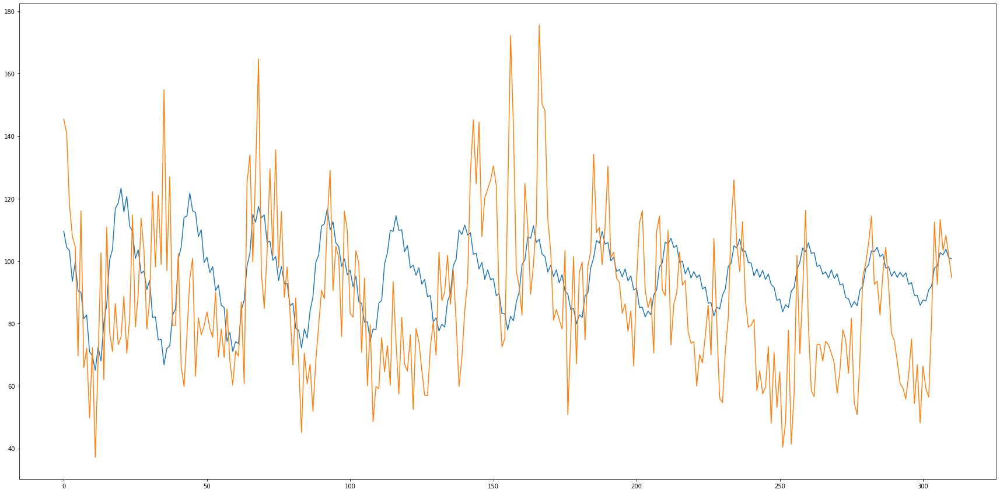

In [397]:
plt.figure(figsize=(30,15))

plt.plot(np.arange(0, len(y_pred)), res.forecast(steps=len(y_real)))
plt.plot(np.arange(0, len(y_real)), y_real)

In [398]:
print('RMSE from single ARIMA: ' ,np.nanmean((res.forecast(steps=len(y_real)) - y_real) ** 2) ** 0.5)

RMSE from single ARIMA:  25.320747697260053


In [399]:
preds = res.forecast(steps=len(y_real))
print('R2 from single ARIMA: ' , r2_score(preds, y_real))

R2 from single ARIMA:  -4.330869003113399


#### Varma df creation

In [230]:
varma_train = np.zeros((train[train.square_id == 48].shape[0], train.square_id.nunique()))
varma_val = np.zeros((val[val.square_id == 48].shape[0], train.square_id.nunique()))

for i, bs in tqdm(enumerate(train.square_id.unique())):
    train_ts = train[train.square_id==bs]['internet'].ffill()
    val_ts = val[val.square_id==bs]['internet'].ffill()
    try:
        varma_train[:,i] = train_ts
        varma_val[:, i] = val_ts
    except ValueError:
        varma_train[:len(train_ts),i] = train_ts
        varma_val[:len(val_ts), i] = val_ts
        print(i, bs)

0it [00:00, ?it/s]

444 4471
484 4570
485 4571
525 4671
526 4672
570 4771
619 4875
833 5439
834 5440


In [ ]:
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.api import VAR

#### Remove linear dependencies

In [290]:
corr_matrix = pd.DataFrame(varma_train).corr().abs()
sol = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
                  .stack()
                  .sort_values(ascending=False))

In [312]:
bad_cols = []
for i in sol[sol>0.7].index:
    bad_cols.append(i[1])
bad_cols = list(set(bad_cols))

In [313]:
varma_train_ = np.delete(varma_train, bad_cols, axis=1)
varma_val_ = np.delete(varma_val, bad_cols, axis=1)


In [316]:
%%time 
model = VAR(endog=varma_train_).fit()

CPU times: user 1.3 s, sys: 31.1 ms, total: 1.33 s
Wall time: 208 ms


### Short-term prediction

In [338]:
steps = 48
mses_var = [] 
preds = model.forecast(varma_train_, steps=48)
for i in tqdm(range(preds.shape[1])):
    mses_var.append(((preds[:48,i]  - varma_val_[:48,i])**2).mean())
    
mses_mean = []
for i in tqdm(range(varma_val_.shape[1])):
    mses_mean.append(((np.ones(varma_val_[:48,i].shape) * varma_train.mean()  - varma_val[:48,i])**2).mean())

  0%|          | 0/374 [00:00<?, ?it/s]

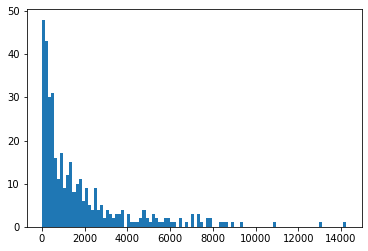

In [340]:
plt.hist(mses_var, bins=100);
plt.hist(mses_mean, bins=100);

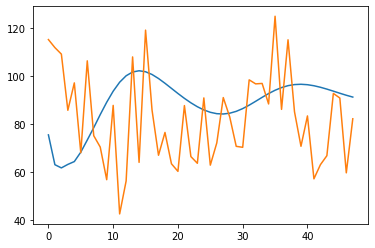

In [347]:
plt.plot(preds[:,2]);
plt.plot(varma_val[:48,2])

In [377]:
np.nanmean(mses_var) ** 0.5

53.57366903104536

In [378]:
np.nanmean(mses_mean) ** 0.5

58.25537187303218

### Long-term predictions

In [366]:
steps = 200
mses_var = [] 
preds = model.forecast(varma_train_, steps=steps)
for i in tqdm(range(preds.shape[1])):
    mses_var.append(((preds[:steps,i]  - varma_val_[:steps,i])**2).mean())
    
mses_mean = []
for i in tqdm(range(varma_val_.shape[1])):
    mses_mean.append(((np.ones(varma_val_[:steps,i].shape) * varma_train.mean()  - varma_val[:steps,i])**2).mean())

  0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/374 [00:00<?, ?it/s]

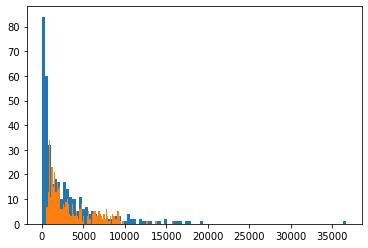

In [367]:
plt.hist(mses_var, bins=100);
plt.hist(mses_mean, bins=100);

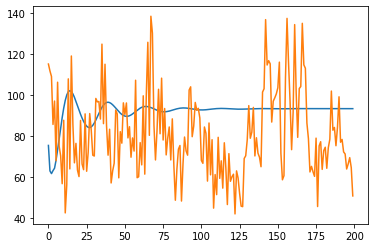

In [368]:
plt.plot(preds[:,2]);
plt.plot(varma_val[:steps,2])

In [380]:
print('RMSE from model: ', np.nanmean(mses_var) ** 0.5) 

RMSE from model:  53.57366903104536


In [382]:
print('RMSE from naive prediction: ', np.nanmean(mses_mean) ** 0.5)

RMSE from naive prediction:  58.25537187303218
